# 📚 Amazon Book Recommendation System using Python  📖

# 1. Business understanding

# 1.1. Background


A **Recommendation System** is a machine learning application for businesses that, through data modeling and algorithms application, tries to predict a rating or preference for a particular item.

# 1.2. Source 

Ih this study, it will be used the Books Dataset from Amazon Reviews data (http://jmcauley.ucsd.edu/data/amazon/).

# 1.3. Introduction to Recommendation systems

In this modern world we are overloaded with data and this data provides us the useful information. But it's not possible for the user to extract the information which interest them from these data. In order to help the user to find out information about the product , recommedation systems where developed. 

Recommeder system creates a similarity between the user and items and exploits the similarity between user/item to make recommendations.



# 1.4. Types of recommendations

There are mainly 6 types of the recommendations systems:

1. Popularity based systems :- It works by recommeding items viewed and purchased by most people and are rated high.It is not a personalized recommendation.
2. Classification model based:- It works by understanding the features of the user and applying the classification algorithm to decide whether the user is     interested or not in the prodcut.
3. Content based recommedations:- It is based on the information on the contents of the item rather than on the user opinions.The main idea is if the user likes an item then he or she will like the "other" similar item.
4. Collaberative Filtering: It is based solely on the past interactions recorded between users and items in order to produce new recommendations. These interactions are stored in the so-called “user-item interactions matrix”. It is mainly of two types:
 a) User-User 
 b) Item -Item
 
5. Hybrid Approaches:- This system approach is to combine collaborative filtering, content-based filtering, and other approaches . 
6. Association rule mining :- Association rules capture the relationships between items based on their patterns of co-occurrence across transactions.

# 1.5. Parameters Information:

● UserId : Every user identified with a unique id 

● BookId : Every book identified with a unique id 

● Rating : Rating of the corresponding product by the corresponding user 

● Timestamp : Time of the rating ( ignore this column for this exercise)


## 📤 Import Libraries

In [1]:
!pip install surprise
!pip install plotly

  Using cached surprise-0.1-py2.py3-none-any.whl (1.8 kB)
  Using cached scikit-surprise-1.1.1.tar.gz (11.8 MB)
  Created wheel for scikit-surprise: filename=scikit_surprise-1.1.1-cp39-cp39-win_amd64.whl size=712508 sha256=413e9da3e6000a578f25683f44d98d21ee80b9270c9fa034eb8d72eb6a9e0a6a
  Stored in directory: c:\users\buenes\appdata\local\pip\cache\wheels\6b\10\c9\7f607c8cb522ef378844f41e63b30d7181a6495d2c1ae514e9
Successfully built scikit-surprise
^C


In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

# Graph Objects
import plotly.graph_objs as go

#from scipy.sparse.linalg import svds

#Surprise is a Python scikit for building and analyzing recommender systems that deal with explicit rating data.

import os

from surprise import Reader, Dataset, accuracy
from surprise.model_selection import train_test_split, cross_validate
from surprise import SVD, KNNWithMeans

from sklearn.decomposition import TruncatedSVD

In [33]:
# to set the limit to 1 decimal
pd.options.display.float_format = '{:.1f}'.format

## 💾  Check out the Data

In [34]:
df = pd.read_csv('Documents/Projeto_Amazon/ratings_Books.csv', names=['userId', 'bookId','rating','timestamp'])
df.head()

,userId,bookId,rating,timestamp
0,AH2L9G3DQHHAJ,0000000116,4.0,1019865600
1,A2IIIDRK3PRRZY,0000000116,1.0,1395619200
2,A1TADCM7YWPQ8M,0000000868,4.0,1031702400
3,AWGH7V0BDOJKB,0000013714,4.0,1383177600
4,A3UTQPQPM4TQO0,0000013714,5.0,1374883200


In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22507155 entries, 0 to 22507154
Data columns (total 4 columns):
 #   Column     Dtype  
---  ------     -----  
 0   userId     object 
 1   bookId     object 
 2   rating     float64
 3   timestamp  int64  
dtypes: float64(1), int64(1), object(2)
memory usage: 686.9+ MB


In [36]:
df.shape

(22507155, 4)

Take a subset of the dataset to make it less sparse/ denser </center>

## DATA CLEANING

In [37]:
# Check Duplicate.
df.duplicated().sum()

0

There are no duplicate data.

In [38]:
df.columns

Index(['userId', 'bookId', 'rating', 'timestamp'], dtype='object')

**There are three columns: userId, bookId, ratings and timestamp, but the timestamp column will be deleted.**

In [39]:
#exclude the timestamp column

df.drop(columns=['timestamp'], inplace=True)

In [40]:
#check if the column "timestamp was deleted"
df.columns

Index(['userId', 'bookId', 'rating'], dtype='object')

**Checking for missing values using isnull()**

In [41]:
df.isnull().sum()

userId    0
bookId    0
rating    0
dtype: int64

No missing values in this dataset.

## EDA (Data Analysis and Preparation)

In [42]:
df.describe()

,rating
count,22507155.0
mean,4.3
std,1.1
min,1.0
25%,4.0
50%,5.0
75%,5.0
max,5.0


In [43]:
#Taking subset with 5% of the books dataset.
#I selected rows 0 till 2250715 and all the columns
df = df.iloc[:1125358,:]
df.describe()

,rating
count,1125358.0
mean,4.2
std,1.1
min,1.0
25%,4.0
50%,5.0
75%,5.0
max,5.0


## Ratings Distribution by Book

In [44]:
# Number of ratings per productId
data = df.groupby('bookId')['rating'].count()

# Create trace
trace = go.Histogram(x = data.values,
                     name = 'rating',
                     xbins = dict(start = 0,
                                  end = 50,
                                  size = 2))
# Create layout
layout = go.Layout(title = 'Distribution Of Number of Ratings per Book',
                   xaxis = dict(title = 'Number of Ratings per Book'),
                   yaxis = dict(title = 'Count'),
                   bargap = 0.2,
                   font=dict(family="Arial", size=16))

# Create plot
fig = go.Figure(data=[trace], layout=layout)
fig.show()

## Ratings Distribution by User

In [45]:
# Number of ratings per userID
data = df.groupby('userId')['rating'].count()


# Create trace
trace = go.Histogram(x = data.values,
                     name = 'rating',
                     xbins = dict(start = 0,
                                  end = 20,
                                  size = 2))

# Create layout
layout = go.Layout(title = 'Distribution Of Number of Ratings by User',
                   xaxis = dict(title = 'Number of Ratings by User'),
                   yaxis = dict(title = 'Count'),
                   bargap = 0.2,
                  font=dict(family="Arial", size=16))

# Create plot
fig = go.Figure(data=[trace], layout=layout)
fig.show()

**Ratings Distribution - Ratings are on scale from 1 to 5**

Catplot can be useful for this kind of visualization as well. This allows you to view the distribution of a parameter within bins defined by any other parameter:

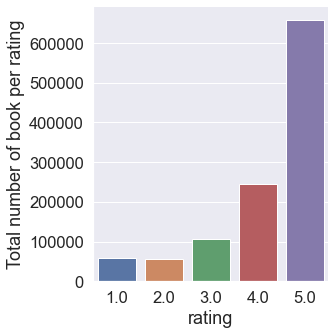

In [46]:
# Check the distribution of ratings
sns.set(font_scale=1.5) 
g=sns.catplot(data=df, x="rating", kind="count")
g.set_ylabels("Total number of book per rating");

In [47]:
# Count books based on ratings

print("*"*40)
for c in range(1,6):
  print('Number of books with rating {} = {}'.format(c, df[df['rating'] == c].shape[0]))

print("*"*40)

****************************************
Number of books with rating 1 = 58836
Number of books with rating 2 = 56685
Number of books with rating 3 = 107474
Number of books with rating 4 = 243857
Number of books with rating 5 = 658506
****************************************


In [48]:
# Number of unique user id and product id in the data

print("*"*46)
print('Number of unique USERS in Raw data = ', df['userId'].nunique())
print('Number of unique BOOKS in Raw data = ', df['bookId'].nunique())
print("*"*46)

**********************************************
Number of unique USERS in Raw data =  765170
Number of unique BOOKS in Raw data =  42302
**********************************************


In [49]:
# Top 10 users based on rating
top_users=df.groupby('userId').size().sort_values(ascending=False)[:10]
top_users

userId
AFVQZQ8PW0L       2254
A2F6N60Z96CAJI     772
A14OJS0VWMOSWO     531
A2TX179XAT5GRP     451
AHUT55E980RDR      396
A320TMDV6KCFU      380
A1K1JW1C5CUSUZ     350
A1NATT3PN24QWY     325
A3M174IC0VXOS2     271
A1D2C0WDCSHUWZ     258
dtype: int64

In [50]:
# Top 10 books based on rating
top_products = df.groupby('bookId').size().sort_values(ascending=False)[:10]
top_products

bookId
0007444117    12629
0007442920    10172
0007386648     9062
0061950726     6612
0002247399     6473
0002007770     6001
0061537934     4736
0007124015     4321
0062024027     4240
0062082353     4160
dtype: int64

**Let's go extract a subset of the dataset. It will probably perform better**

Getting the new dataframe which contains users who has given 100 or more ratings


In [51]:
#Getting the new dataframe which contains users who has given 100 or more ratings

df_subset=df.groupby("bookId").filter(lambda x:x['rating'].count() >=100)
df_subset

,userId,bookId,rating
60,A1CP960DFEHZ5H,000100039X,5.0
61,A10000012B7CGYKOMPQ4L,000100039X,5.0
62,A2S166WSCFIFP5,000100039X,5.0
63,A1BM81XB4QHOA3,000100039X,5.0
64,A2MKF9WWPC181T,000100039X,5.0
...,...,...,...
1120180,A28AH39X5713E5,007159857X,5.0
1120181,A1JR0017OUNGC9,007159857X,5.0
1120182,A22WCPNK0MUDIQ,007159857X,2.0
1120183,ARG4PBPSUSM0Y,007159857X,4.0


In [52]:
df_subset_surprise = pd.DataFrame(df_subset.groupby('bookId').rating.mean())
df_subset_surprise

,rating
bookId,
000100039X,4.6
0002007770,4.4
0002051850,4.3
0002185385,4.6
0002219417,4.6
...,...
0071549579,4.2
0071591060,4.5
0071597174,4.4


In [53]:
#Average rating of the book
dataset_subset_mean = pd.DataFrame(df_subset.groupby('bookId')['rating'].mean().sort_values(ascending=False).head())
dataset_subset_mean

,rating
bookId,
0060670207,4.9
0060525851,4.9
0061994715,4.9
0062200909,4.9
0061906220,4.9


In [54]:
#Total no of rating for book

dataset_subset_count=pd.DataFrame(df_subset.groupby('bookId')['rating'].count().sort_values(ascending=False).head())
dataset_subset_count

,rating
bookId,
0007444117,12629
0007442920,10172
0007386648,9062
0061950726,6612
0002247399,6473


In [55]:
# Number of unique user id and product id in the subset

print("*"*47)
print('Number of unique USERS in the subset = ', df_subset['userId'].nunique())
print('Number of unique BOOKS in the subset = ', df_subset['bookId'].nunique())
print("*"*47)

***********************************************
Number of unique USERS in the subset =  494935
Number of unique BOOKS in the subset =  2107
***********************************************


**MODEL BUILDING WITH SURPRISE**

In [56]:
#Reading the dataset
reader = Reader(rating_scale=(1, 5))
data = Dataset.load_from_df(df_subset,reader)

random_pred.NormalPredictor:	Algorithm predicting a random rating based on the distribution of the training set, which is assumed to be normal.

baseline_only.BaselineOnly:	Algorithm predicting the baseline estimate for given user and item.

knns.KNNBasic:	A basic collaborative filtering algorithm.

knns.KNNWithMeans:	A basic collaborative filtering algorithm, taking into account the mean ratings of each user.

knns.KNNWithZScore:	A basic collaborative filtering algorithm, taking into account

knns.KNNBaseline:	A basic collaborative filtering algorithm taking into account a baseline rating.

matrix_factorization.SVD:	The famous SVD algorithm, as popularized by Simon Funk during the Netflix Prize.When baselines are not used, this is equivalent to Probabilistic Matrix Factorization [SM08] (see note below).

matrix_factorization.SVDpp:	The SVD++ algorithm, an extension of SVD taking into account implicit ratings.

matrix_factorization.NMF:	A collaborative filtering algorithm based on Non-negative Matrix Factorization.

slope_one.SlopeOne:	A simple yet accurate collaborative filtering algorithm.

co_clustering.CoClustering:A collaborative filtering algorithm based on co-clustering.

**Train and Test Split the sample**

In [57]:
# Split the dataset into train and test set in a ratio of 70%:30%
trainset, testset = train_test_split(data, test_size=.30, random_state=10)

# Recommender Systems using KNN with Means

In [63]:
# Use user_based true/false to switch between user-based or item-based collaborative filtering

algo = KNNWithMeans(k=5, min_k=2, sim_options={'name': 'pearson_baseline', 'user_based': False})
algo.fit(trainset)

Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.


In [64]:
# run the trained model against the testset
prediction = algo.test(testset)

In [65]:
# Evaluation
print("Item-based Model : Test Set")
accuracy.rmse(prediction, verbose=True)
accuracy.mae(prediction, verbose=True)

Item-based Model : Test Set
RMSE: 1.1135
MAE:  0.8614


0.8614101777044753

In [66]:
#Use the get_neighbors function to get 10 recommendation
algo.get_neighbors(1, 10)

[45, 318, 132, 18, 631, 251, 209, 107, 1083, 648]

In [68]:
# Here are the 10 recommended book

df_subset_surprise.iloc[[45, 318, 132, 18, 631, 251, 209, 107, 1083, 648]].index

Index(['0007157169', '0060530499', '0028630238', '000649885X', '0060874163',
       '0060294698', '0060193395', '0007491263', '0061575224', '0060887354'],
      dtype='object', name='bookId')

# Recommender Systems using SVD

In [69]:
#Let's go use the famous SVD algorithm.
algo_SVD = SVD()

# Run 5-fold cross-validation and print results
cross_validate(algo_SVD, data, measures=['RMSE', 'MAE'], cv=5, verbose=True)

Evaluating RMSE, MAE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    1.0538  1.0597  1.0538  1.0569  1.0572  1.0563  0.0023  
MAE (testset)     0.8013  0.8031  0.8010  0.8016  0.8013  0.8017  0.0008  
Fit time          30.36   32.88   32.51   31.30   31.83   31.78   0.89    
Test time         0.80    1.44    0.83    0.79    0.83    0.94    0.25    


{'test_rmse': array([1.0538309 , 1.05974943, 1.05379983, 1.05692511, 1.05715759]),
 'test_mae': array([0.8013055 , 0.80312836, 0.80102456, 0.80164182, 0.80128354]),
 'fit_time': (30.359473943710327,
  32.87569499015808,
  32.509336709976196,
  31.30329990386963,
  31.82831335067749),
 'test_time': (0.7990016937255859,
  1.4416475296020508,
  0.8310348987579346,
  0.7900006771087646,
  0.8310325145721436)}

In [70]:
# Train the algorithm on the trainset, and predict ratings for the testset
algo_SVD.fit(trainset)
predictions = algo_SVD.test(testset)

# Then compute RMSE
accuracy.rmse(predictions)
accuracy.mae(predictions)

RMSE: 1.0591
MAE:  0.8027


0.8027425594390278

In [71]:
# Using the get top N function from the Surprise documentation
def get_top_n(predictions, n=5):

    # First map the predictions to each user.
    top_n = dict()
    for uid, iid, true_r, est, _ in predictions:
        current = top_n.get(uid, [])
        current.append((iid, est))
        top_n[uid] = current

    # Then sort the predictions for each user and retrieve the k highest ones.
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]

    return top_n

In [72]:
models = [algo_SVD, algo]
model_names = ['Matrix Factorization', 'Item-Based']

for i, model in enumerate(models):
    model.fit(trainset)
    predictions = model.test(testset)
    top_n = get_top_n(predictions, n=5)
    # Print one line
    user = list(top_n.keys())[14]
    print('- ' *10)
    print(f'model name: {model_names[i]}')
    print(f'user ID: {user}')
    print(f'top 5 products ID\'s this user would like, sorted by rating highest to lowest: {top_n[user]}')

- - - - - - - - - - 
model name: Matrix Factorization
user ID: A2CAF6DVZOHMHG
top 5 products ID's this user would like, sorted by rating highest to lowest: [('0061728977', 4.267914572773997)]
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
- - - - - - - - - - 
model name: Item-Based
user ID: A2CAF6DVZOHMHG
top 5 products ID's this user would like, sorted by rating highest to lowest: [('0061728977', 4.255533545775558)]


# Collaborative filtering system

Finally, a more complex model that is the Matrix Factorization, taking into consideration the user name and book id to make the predictions.

In [73]:
#Let's use 100k rows for computation reason
df_subset1=df_subset.head(100000)
ratings_matrix = df_subset1.pivot_table(values='rating', index='userId', columns='bookId', fill_value=0)
ratings_matrix.head()

bookId,000100039X,0002007770,0002051850,0002185385,0002219417,000222383X,000224053X,0002242052,0002247399,0002550938,...,0060002484,006000438X,0060004878,0060005696,0060005726,0060005777,0060006927,0060007192,0060007737,0060009241
userId,,,,,,,,,,,,,,,,,,,,,
A00039763E5V43M02Z3YZ,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A00115723IFW2X9CUR3ST,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A00369122K166QHZJL54X,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A00652961QVJY2CGHFVP6,0,4,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A008483934S118DJU1U2C,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [74]:
ratings_matrix.shape

(91522, 156)

In [75]:
X = ratings_matrix.T
X.head()

userId,A00039763E5V43M02Z3YZ,A00115723IFW2X9CUR3ST,A00369122K166QHZJL54X,A00652961QVJY2CGHFVP6,A008483934S118DJU1U2C,A00882592E5IMSN8FDQ0I,A01079131OLTHGTTBEQXH,A010997525FU27TAPMJCG,A011375310EMGKL9Z35WC,A011769335YMOT60VKVFZ,...,AZZP79XF408R5,AZZR4T996J02D,AZZU1LOJLV09V,AZZVLL8QF9TKK,AZZVSKBW66DXZ,AZZVZL4QEHEHO,AZZX4RK6U8P1T,AZZXCFBNEWIBQ,AZZXOLCNO9C18,AZZY4W8E5AX2K
bookId,,,,,,,,,,,,,,,,,,,,,
000100039X,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0002007770,0,0,0,4,0,0,5,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0002051850,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0002185385,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0002219417,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [76]:
X.shape

(156, 91522)

Let's go reduce the dimensionality with truncated SVD. 

In [77]:
#Decomposing the Matrix
SVD = TruncatedSVD(n_components=10)
decomposed_matrix = SVD.fit_transform(X)
decomposed_matrix.shape

(156, 10)

Let's go calculate the correlation between the itens. The closer the numbers get to 1, the more similar items/users are. The more they go to -1, the more different.

In [78]:
#Correlation Matrix

correlation_matrix = np.corrcoef(decomposed_matrix)
correlation_matrix

array([[ 1.        ,  0.21033058, -0.47227564, ..., -0.10603231,
        -0.171463  , -0.58226577],
       [ 0.21033058,  1.        ,  0.03645834, ..., -0.22693326,
        -0.13237411,  0.57683422],
       [-0.47227564,  0.03645834,  1.        , ...,  0.46140009,
         0.16489512,  0.5702414 ],
       ...,
       [-0.10603231, -0.22693326,  0.46140009, ...,  1.        ,
        -0.21814266, -0.11783819],
       [-0.171463  , -0.13237411,  0.16489512, ..., -0.21814266,
         1.        ,  0.01786307],
       [-0.58226577,  0.57683422,  0.5702414 , ..., -0.11783819,
         0.01786307,  1.        ]])

In [79]:
X.index[155]

'0060009241'

In [80]:
# Choosing a product from the list to get the recommendations for. I have chosen the same as the Item-based recommender.
i = "0002007770"

book_names = list(X.index)
book_ID = book_names.index(i)
book_ID

1

In [81]:
book_correlation = correlation_matrix[book_ID]
book_correlation.shape

(156,)

In [82]:
# Top 10 products similar to product 9742356831 recommended for this user.
Recommend = list(X.index[book_correlation > 0.65])

# Removes the item already bought by the customer
Recommend.remove(i) 

Recommend[0:10]

['0002185385',
 '0006479677',
 '0007149824',
 '0007229682',
 '0007245823',
 '0007248075',
 '0007256817',
 '0007281048',
 '0007325169',
 '0007486774']

In [83]:
# Both model's recommendations
KNNWithMeans = ['0060723513', '0006550339', '0230769152', '0060510609', '0140714766','0062066390', '0061458031', '0060012382', '0071486100', '0061241091']
algo_SVD = ['616719923X', 'B0000CF8T1', 'B0000DC2VI', 'B0000V8IOE', 'B00015UC4I', 'B00015UC4S', 'B0001AO8DY', 'B0001CXUHW', 'B0001M0Z6Q','B0002163']
collaborative = ['0002185385', '0006479677', '0007149824', '0007199058', '0007229682', '0007245823','0007248075','0007256817','0007281048','0007325169']

In [84]:
# How many overlaps between KNNWithMeans and SVD
count = 0
for i in KNNWithMeans:
    if i in algo_SVD:
        count +=1
count

0

In [85]:
# How many overlaps between three recommendation systems
count = 0
for i in KNNWithMeans or algo_SVD:
    if i in collaborative:
        count +=1

count

0

# Reference


To take more information about Surprise Library, acess of Surprise’ documentation!

https://surprise.readthedocs.io/en/stable/index.html


Look to this excelente kernel from Saurav Anand. I based my study in this kernel.
https://www.kaggle.com/saurav9786/recommender-system-using-amazon-reviews#